In [1]:
import boto3
import io
import pandas as pd
import numpy as np
from PIL.Image import Image
import matplotlib.pyplot as plt
from utils.plot import plot_image, load_tiny_batch, plot_images_grid, draw_boxes

%config InlineBackend.figure_format = 'retina'

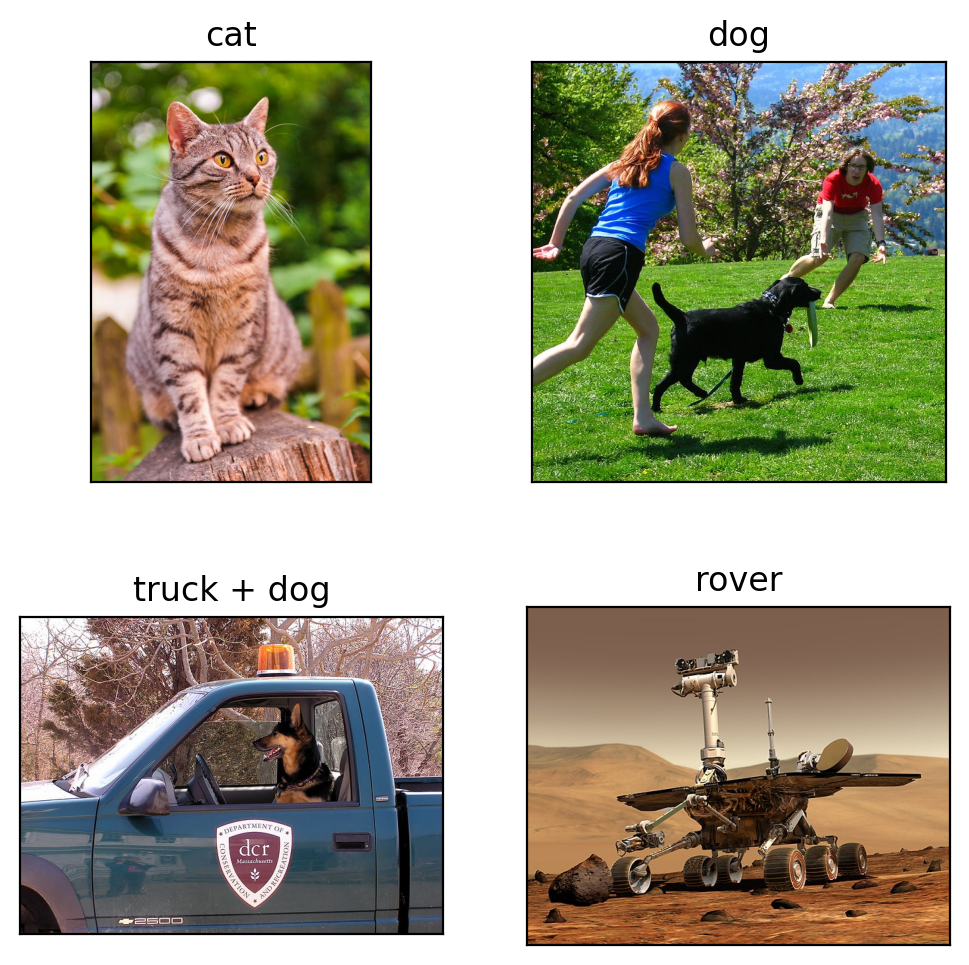

In [2]:
# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [3]:
def detect_objects(image: Image):
    image_bytes = io.BytesIO()
    image.save(image_bytes, format='PNG')
    image_bytes = image_bytes.getvalue()

    client = boto3.client('rekognition', region_name='us-west-2')
    response = client.detect_labels(
        Image={
            'Bytes': image_bytes
        },
        MinConfidence=80,
    )
    
    summary = pd.DataFrame([
        {
            'Name': r['Name'], 
            'Confidence': round(r['Confidence'], 1), 
            'Instances': len(r['Instances'])
        } 
        for r in response['Labels']
        if len(r['Instances']) > 0
        and r['Confidence'] > 80
    ])
    
    boxes = []
    class_names = []
    scores = []
    for label in response['Labels']:
        for instance in label['Instances']:
            class_names.append(label['Name'])
            scores.append(instance['Confidence'] / 100)
            boxes.append((
                instance['BoundingBox']['Left'] * image.width,
                instance['BoundingBox']['Top'] * image.height,
                instance['BoundingBox']['Width'] * image.width,
                instance['BoundingBox']['Height'] * image.height,
            ))
            
    image = draw_boxes(np.array(image), np.array(boxes), class_names, scores)
    return image, summary

,Name,Confidence,Instances
0,Cat,98.3,1


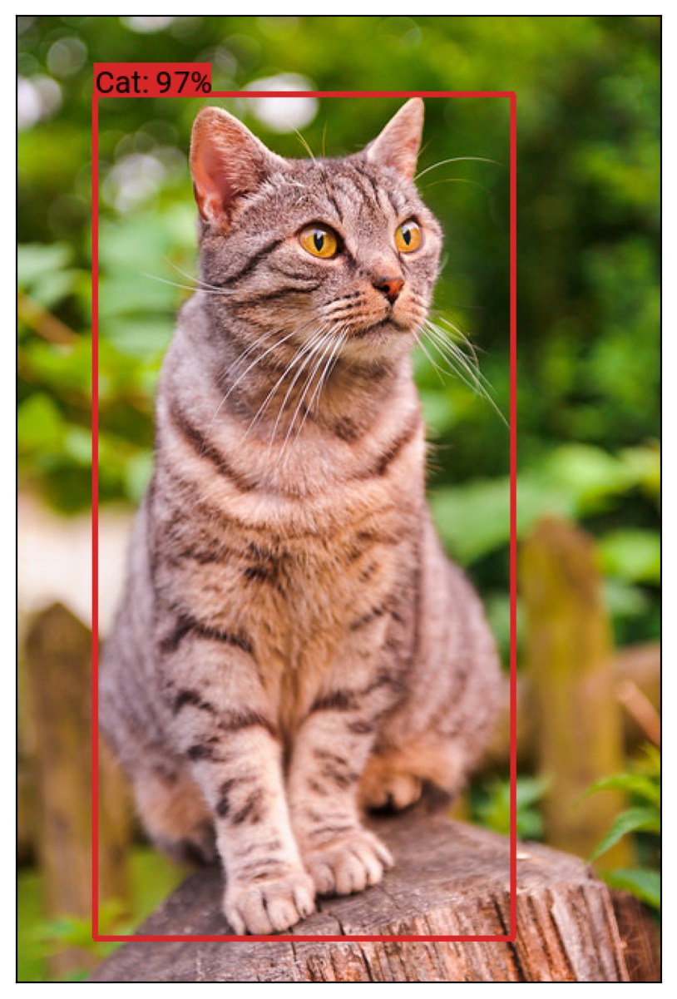

In [4]:
image, summary = detect_objects(images_raw['cat'])
plot_image(image, figsize=[5, 10])
summary

,Name,Confidence,Instances
0,Shorts,100.0,1
1,Person,100.0,3
2,Dog,99.2,1
3,Glasses,97.9,1


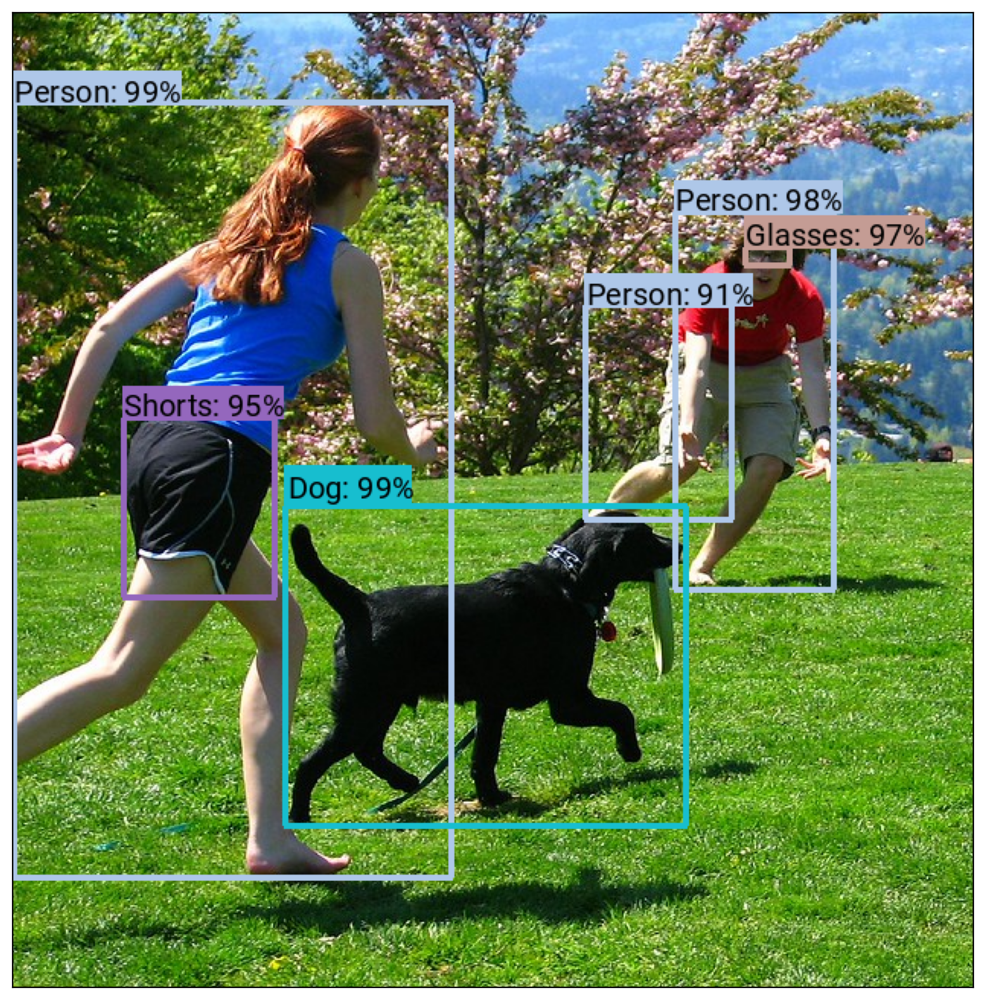

In [5]:
image, summary = detect_objects(images_raw['dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Truck,99.9,1
1,Dog,99.1,1


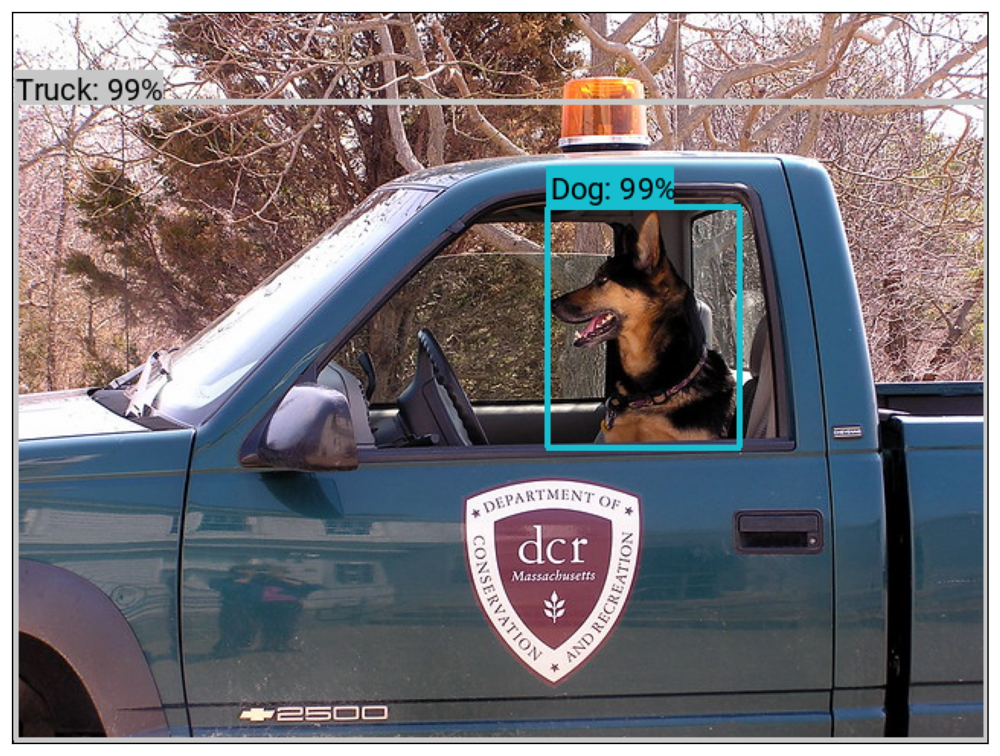

In [6]:
image, summary = detect_objects(images_raw['truck + dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Airplane,88.9,1
1,Bird,87.3,1


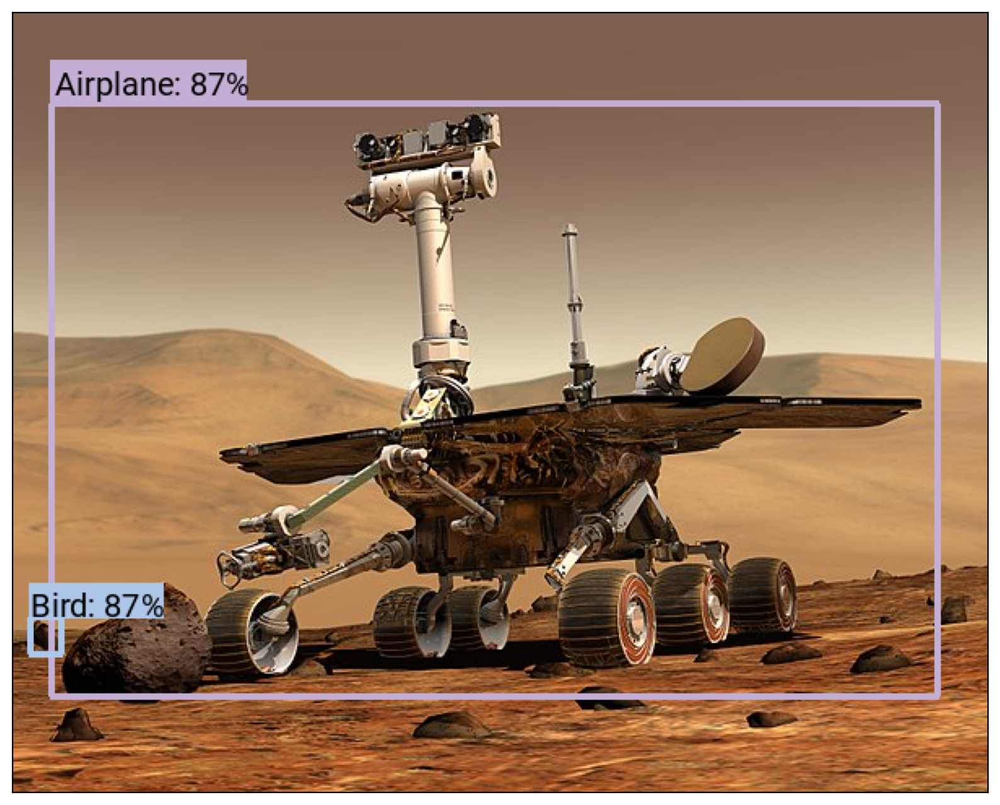

In [7]:
image, summary = detect_objects(images_raw['rover'])
plot_image(image, figsize=[10, 10])
summary